## Problem statement:


1. Calculate an extreme rainfall event metric from the daily surface precipitation output of a climate model for the years 1994-2014. The metric for extreme rainfall events is the annual maximum precipitation amount falling in a single day in millimetres.
2. After the calculation, visualize the historical data using maps and graphs.

In [1]:
import netCDF4
import os
import numpy as np
import numpy.ma as ma
from mpl_toolkits.basemap import Basemap, shiftgrid
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import matplotlib
# matplotlib.use("Agg")
from matplotlib import colors as c
%matplotlib inline
import re
from scipy.stats import linregress
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [2]:
# Define constant
DATA_FOLDER = r"C:\Users\vivia\Documents\Career\Job Search\applied\STPL 2023\Aon\NEX-GDDP-CMIP6"
INIT_DATE = datetime(1850,1,1)
PR_MM = 86400
LAT_RESOLUTION = 0.25
LON_RESOLUTION = 0.25

In [3]:
# Find files between 1994 and 2014
nc_file_ls = os.listdir(DATA_FOLDER)
pattern = re.compile(r"pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_(199[4-9]|200[0-9]|201[0-4]).nc")
selected_file_ls = [file for file in nc_file_ls if pattern.match(file)]
print(selected_file_ls)

['pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_1994.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_1995.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_1996.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_1997.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_1998.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_1999.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2000.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2001.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2002.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2003.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2004.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2005.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2006.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2007.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2008.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2009.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2010.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2011.nc', 'pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2012.nc', 'pr_day_ACC

## Understanding the data

In [4]:
f0 = netCDF4.Dataset(os.path.join(DATA_FOLDER, selected_file_ls[0]))
print(f0)

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4_CLASSIC data model, file format HDF5):
    activity: NEX-GDDP-CMIP6
    contact: Dr. Rama Nemani: rama.nemani@nasa.gov, Dr. Bridget Thrasher: bridget@climateanalyticsgroup.org
    Conventions: CF-1.7
    creation_date: 2021-10-04T14:00:02.490123+00:00
    frequency: day
    institution: NASA Earth Exchange, NASA Ames Research Center, Moffett Field, CA 94035
    variant_label: r1i1p1f1
    product: output
    realm: atmos
    source: BCSD
    scenario: historical
    references: BCSD method: Thrasher et al., 2012, Hydrol. Earth Syst. Sci.,16, 3309-3314. Ref period obs: latest version of the Princeton Global Meteorological Forcings (http://hydrology.princeton.edu/data.php), based on Sheffield et al., 2006, J. Climate, 19 (13), 3088-3111.
    version: 1.0
    tracking_id: ef0df0c5-22e6-491f-9b8c-68ed95f5711a
    title: ACCESS-CM2, r1i1p1f1, historical, global downscaled CMIP6 climate projection data
    resolution_id: 0.25 degree
    

In [5]:
print(f0.variables)
f0.close()

{'time': <class 'netCDF4._netCDF4.Variable'>
float64 time(time)
    axis: T
    calendar: proleptic_gregorian
    units: days since 1850-01-01
    long_name: time
    standard_name: time
unlimited dimensions: time
current shape = (365,)
filling on, default _FillValue of 9.969209968386869e+36 used, 'pr': <class 'netCDF4._netCDF4.Variable'>
float32 pr(time, lat, lon)
    _FillValue: 1e+20
    standard_name: precipitation_flux
    long_name: Precipitation
    units: kg m-2 s-1
    comment: includes both liquid and solid phases
    cell_methods: area: time: mean
    cell_measures: area: areacella
    missing_value: 1e+20
unlimited dimensions: time
current shape = (365, 600, 1440)
filling on, 'lat': <class 'netCDF4._netCDF4.Variable'>
float64 lat(lat)
    units: degrees_north
    standard_name: latitude
    long_name: latitude
    axis: Y
unlimited dimensions: 
current shape = (600,)
filling on, default _FillValue of 9.969209968386869e+36 used, 'lon': <class 'netCDF4._netCDF4.Variable'>
flo

## Data extraction and preprocessing

In [6]:
# Extract data and data integrity check

# Initialize lists to store data
pr_ls = [None] * len(selected_file_ls)
time_ls = [None] * len(selected_file_ls)
year_ls = [None] * len(selected_file_ls)

# Get base information from 1st file as default comparison
f0 = netCDF4.Dataset(os.path.join(DATA_FOLDER, selected_file_ls[0]))
lat = f0.variables['lat'][:]
lon = f0.variables['lon'][:]
pr0 = f0.variables['pr'][:]

# Check the number of days certain observation points don't have readings
no_obs_cnt0 = np.ma.count_masked(pr0)
no_obs_days = np.ma.count_masked(pr0, axis=0)
if not np.array_equal(np.sort(np.unique(no_obs_days)), np.array([0, 365])):
    print('Alert: Some observation point dont have reading only for some days')
    
# Adjusting no_obs_days for leap years
no_obs_days_leap_yr = np.where(no_obs_days == 0, 0, no_obs_days + 1)
pt_cnt0 = pr0.size
print(f'In first file, {no_obs_cnt0} of {pt_cnt0} ({no_obs_cnt0/pt_cnt0*100:.2f}%) observation point have no readings')

# Extract data from the first file
pr_ls[0] = pr0
time_ls[0] = f0.variables['time'][:]
year_ls[0] = int(selected_file_ls[0].split('.')[0][-4:])

# Iterate over other files for comparison and extraction
for i, file_i in enumerate(selected_file_ls[1:], start=1):
    fi = netCDF4.Dataset(os.path.join(DATA_FOLDER, file_i))
    lati = fi.variables['lat'][:]
    loni = fi.variables['lon'][:]
    pri = fi.variables['pr'][:]
    no_obs_daysi = np.ma.count_masked(pri, axis=0)
    
    # Check if all files have the same longitude and latitude
    if ~np.ma.allequal(lat, lati) or ~np.ma.allequal(lon, loni):
        print(file_i, 'has different long lat')
        
    # Check if all files have the same number of observation points with readings
    # check for leap year
    year = int(file_i.split('.')[0][-4:])
    if year % 4 == 0:
        no_obs_days_arr = no_obs_days_leap_yr
    else:
        no_obs_days_arr = no_obs_days
    
    if not (no_obs_days_arr==no_obs_daysi).all():
        print(file_i, 'has different number of observation points: {no_reading_cnti}')  
    
    # Extract data
    pr_ls[i] = pri
    time_ls[i] = fi.variables['time'][:]
    year_ls[i] = year
    
    fi.close()
f0.close()
print('Done reading and checking')

# Clean up variables to free memory
del lati, loni, pri, pr0, no_obs_daysi, no_obs_days_arr, no_obs_days, no_obs_days_leap_yr

In first file, 218535720 of 315360000 (69.30%) observation point have no readings
Done reading and checking


In [7]:
# Preprocess data: Time, longtitude and latitude

def time_to_date(time_ma, init_date=INIT_DATE):
    '''
    Calculate dates by adding days to the base date
    '''
    valid_values = time_ma.compressed()
    dates = [(init_date + timedelta(days=value)).date() for value in valid_values]
    dates_array = np.array(dates)
    masked_dates_array = ma.masked_array(dates_array, mask=time_ma.mask, fill_value=time_ma.fill_value)
    
    return masked_dates_array

def shift_lon_grid(reading, longtitude):
    '''
    Function to shift the longitude grid from 0-360 to -180-180
    '''
    reading_shift, longtitude_shift = shiftgrid(180., reading, longtitude, start=False)
    return reading_shift, longtitude_shift

# Convert time values to dates for all files
date_ls = [time_to_date(time, init_date=INIT_DATE) for time in time_ls] 

# Shift the longitude grid (pr_ls[0][0] is just a dummy)
_, lon_shift = shift_lon_grid(pr_ls[0][0], lon)

# Adjust latitudes and longitudes to represent the corner locations of pixels
lat_corners = np.concatenate(([lat[0] - LAT_RESOLUTION / 2], lat + LAT_RESOLUTION / 2))
lon_shift_corners = np.concatenate(([lon_shift[0] - LON_RESOLUTION / 2], lon_shift + LON_RESOLUTION / 2))


## Annual maximum precipitation amount falling in a single day in millimetres

There are two approach to understand "annual maximum precipitation amount falling in a single day". 

- Approach 1: This approach identifies the single day of each year where the global precipitation is the highest compared to the rest of the days within that year. Essentially, it aims to find the annual wettest day globally. This approach provides insight into the overall extreme rainfall events on a global scale.

- Approach 2: In contrast, this approach focuses on identifying the wettest day for each location individually within a given year. It recognizes that the wet season varies across different locations, so what constitutes the wettest day may differ depending on the location. This approach provides a more localized understanding of extreme rainfall events and their impacts on specific regions.

### Approach 1: Same date for all observation points (Global)

Calculation of metric

In [8]:
# Daily precipitation every year
daily_pr_per_year = [pr.sum(axis=(1,2)) for pr in pr_ls]

# Index of the day with maximum precipitation for each year
max_pr_idx_per_year = [np.argmax(daily_pr) for daily_pr in daily_pr_per_year]

# Maximum precipitation in a single day (combine all location)
max_pr_mm_1d_annual = [pr[idx] * PR_MM for pr, idx in zip(daily_pr_per_year, max_pr_idx_per_year)]

# Date of the year with maximum precipitation (combine all location)
max_pr_date_1d_annual = [dates[idx] for dates, idx in zip(date_ls, max_pr_idx_per_year)]

# Precipitation data (shape: lat x long) for each year corresponding to the day with maximum precipitation
max_pr_mm_1d_annual_map = [pr[idx] * PR_MM for pr, idx in zip(pr_ls, max_pr_idx_per_year)]

# Metric: Shift longitudes for precipitation (shape: lat x long) corresponding to the day with maximum precipitation for each year
max_pr_mm_1d_annual_map_shift = [shift_lon_grid(pr_mm_map, lon)[0] for pr_mm_map in max_pr_mm_1d_annual_map]

# Historical maximum precipitation on the wettest day
max_pr_mm_1loc = max([np.max(pr_map) for pr_map in max_pr_mm_1d_annual_map])

Visualization

slope: 3282.541488052964


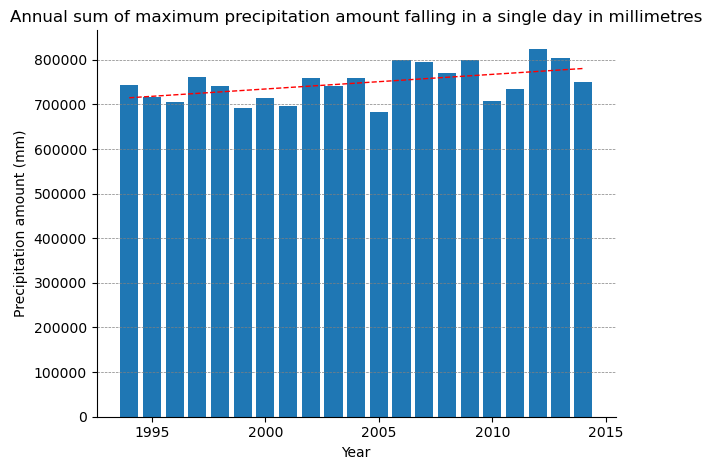

In [9]:
# Bar chart showing the annual sum of maximum precipitation amount falling in a single day
fig, ax = plt.subplots()

# Plotting the data
ax.bar(year_ls, max_pr_mm_1d_annual)

# Setting labels and title
ax.set_ylabel('Precipitation amount (mm)')
ax.set_xlabel('Year')
ax.set_title('Annual sum of maximum precipitation amount falling in a single day in millimetres')

# Setting tick parameters and removing spines
ax.tick_params(axis='both', which='major', labelsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Adding gridlines
ax.yaxis.grid(True, linestyle='--', linewidth='0.5', color='gray')

# # Calculate the trend line
year_arr = np.array(year_ls)
slope, intercept, _, _, _ = linregress(year_arr, max_pr_mm_1d_annual)
trend_line = intercept + slope * year_arr
print('slope:', slope)

# # Plot the trend line
ax.plot(year_ls, trend_line, color='red', linestyle='--', linewidth=1)

plt.tight_layout()
plt.show()


In [10]:
# Get the indices that would sort the maximum precipitation array in descending order
rank_idx_desc =  np.argsort(max_pr_mm_1d_annual)[::-1]

# Sort the years based on the descending order of maximum precipitation
year_max_pr_desc = np.array(year_ls)[rank_idx_desc]

# Assign ranks to each year based on the sorted indices
year_ranks = np.zeros(len(year_ls), dtype=int)

# Iterate over sorted years and print the rank along with total precipitation
for rank_i, (year, rank_idx_i) in enumerate(zip(year_max_pr_desc, rank_idx_desc), start=1):
    print(f"Rank {rank_i}: Year {year} with total precipitation of {max_pr_mm_1d_annual[rank_idx_i]:.2f}")
    year_ranks[rank_idx_i] = rank_i
    

Rank 1: Year 2012 with total precipitation of 824854.45
Rank 2: Year 2013 with total precipitation of 805169.61
Rank 3: Year 2009 with total precipitation of 800387.59
Rank 4: Year 2006 with total precipitation of 800110.08
Rank 5: Year 2007 with total precipitation of 795345.45
Rank 6: Year 2008 with total precipitation of 771189.56
Rank 7: Year 1997 with total precipitation of 761132.46
Rank 8: Year 2004 with total precipitation of 760320.26
Rank 9: Year 2002 with total precipitation of 758655.09
Rank 10: Year 2014 with total precipitation of 750602.39
Rank 11: Year 1994 with total precipitation of 743781.12
Rank 12: Year 2003 with total precipitation of 741671.08
Rank 13: Year 1998 with total precipitation of 741325.67
Rank 14: Year 2011 with total precipitation of 733619.20
Rank 15: Year 1995 with total precipitation of 716366.24
Rank 16: Year 2000 with total precipitation of 713775.17
Rank 17: Year 2010 with total precipitation of 708549.61
Rank 18: Year 1996 with total precipitat

In [11]:
# Annimation:
# Visualize highest recorded precipitation in a day accross year. The colour bar is standardised. 
# It is to identify trend across year for the global wettest day 
def plot_on_map_max_pr(ax, max_pr_day, date_str, vmax, pr_rank):
    '''
    Plot the highest recorded precipitation on a map for a given day.
    '''
    # Highest precipitation at a single location
    highest_pr_region = max_pr_day.max()
    
    # Set subplot title with date, total precipitation of the glob, and maximum precipitation at a single location
    ax.set_title(f"{date_str} : Total precipitation is {max_pr_day.sum():.2f}  (rank {pr_rank}). Highest precipitation at a single location is {highest_pr_region:.2f}.")
    
    # Draw base map
    map = Basemap(llcrnrlat=-90, urcrnrlat=90, llcrnrlon=-180, urcrnrlon=180, resolution='c', epsg=4326, ax=ax)    
    map.drawcoastlines()
    map.fillcontinents(color='#ffe2ab')

    # Draw parallels and meridians
    map.drawparallels(np.arange(-90.,120.,30.), labels=[1,0,0,0])
    map.drawmeridians(np.arange(-180.,180.,60.), labels=[0,0,0,1])

    # Create grid for longitudes and latitudes
    llons, llats = np.meshgrid(lon_shift_corners, lat_corners)
    x,y = map(llons, llats)
    
    # Plot filled areas corresponding to precipitation values
    cmap = plt.get_cmap('jet')
    cs = map.pcolormesh(x, y, max_pr_day, cmap=cmap, shading='auto', vmax=vmax)

    # Add color bar
    cbar = map.colorbar(cs, location='bottom', pad=0.5)
    cbar.set_label('Precipitation (mm)')
    return cs

fig, ax = plt.subplots(figsize=[10, 6])

# Add an overall title
fig.suptitle('Annual maximum precipitation amount (mm) falling in a single day', fontsize=20)

def update(frame):
    '''
    Update frames in animation
    '''
    ax.clear()
    max_pr_day, date, year_i_rank = max_pr_mm_1d_annual_map_shift[frame], max_pr_date_1d_annual[frame], year_ranks[frame]
    pr_rank = year_i_rank
    plot_on_map_max_pr(ax, max_pr_day, date, max_pr_mm_1loc, pr_rank)
    
# Define the total number of frames
total_frames = len(max_pr_mm_1d_annual_map_shift)

# Create the animation
ani = FuncAnimation(fig, update, frames=total_frames, interval=1000, repeat=False)
plt.tight_layout()
html_video = ani.to_html5_video()
file_name = "Approach_1_annual_max_pr_1_day.mp4"
ani.save(file_name)
plt.close()
print(f"Refer to {file_name} if no animation show in the output")
HTML(html_video)

Refer to Approach_1_annual_max_pr_1_day.mp4 if no animation show in the output


C:\Users\vivia\anaconda3\envs\env37\lib\site-packages\ipykernel_launcher.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


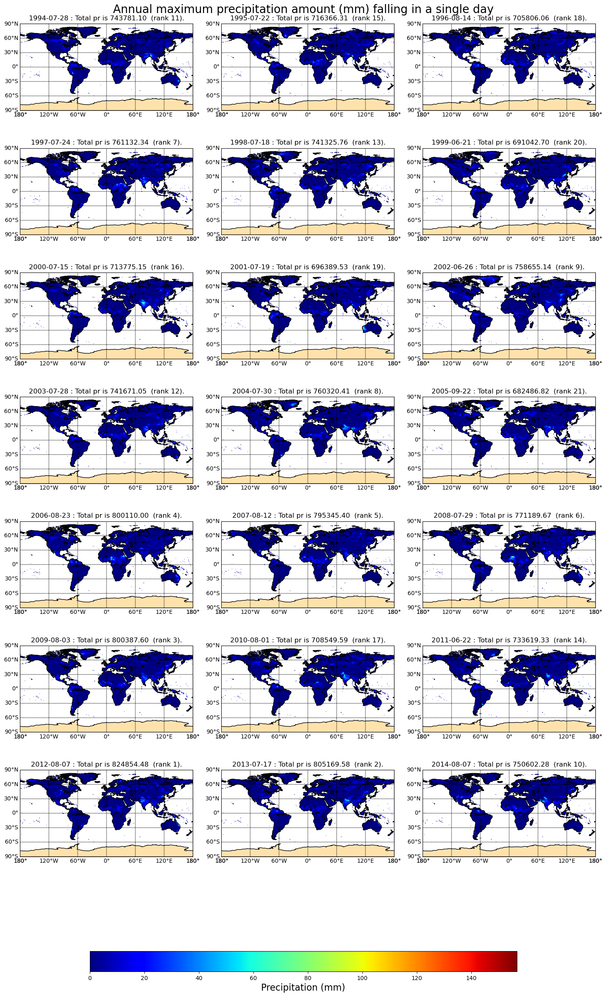

In [12]:
# Flatten the above animation:
# Visualize highest recorded precipitation in a day accross year. The colour bar is standardised. 
# It is to identify trend across year for the global wettest day 

def subplot_on_map(ax, max_pr_day, date_str, vmax, pr_rank):
    # Highest precipitation at a single location
    highest_pr_region = max_pr_day.max()    
    
    # Set subplot title with date and total precipitation
    ax.set_title(f"{date_str} : Total pr is {max_pr_day.sum():.2f}  (rank {pr_rank}).")
    
    # Draw base map
    map = Basemap(llcrnrlat=-90, urcrnrlat=90, llcrnrlon=-180, urcrnrlon=180, resolution='c', epsg=4326, ax=ax)    
    map.drawcoastlines()
    map.fillcontinents(color='#ffe2ab')

    # Draw parallels and meridians.
    map.drawparallels(np.arange(-90.,120.,30.), labels=[1,0,0,0])
    map.drawmeridians(np.arange(-180.,180.,60.), labels=[0,0,0,1])

    # Create grid for longitudes and latitudes
    llons, llats = np.meshgrid(lon_shift_corners, lat_corners)
    x,y = map(llons, llats)
    
    # Plot filled areas corresponding to precipitation values
    cmap = plt.get_cmap('jet')
    cs = map.pcolormesh(x, y, max_pr_day, cmap=cmap, shading='auto', vmax=vmax)
    return cs

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=8, ncols=3, figsize=[15, 25])  # Adjusted number of rows

# Add an overall title
fig.suptitle('Annual maximum precipitation amount (mm) falling in a single day', fontsize=20)

# Iterate over data for each year to create subplots
for i, (max_pr_day, date, year_i_rank) in enumerate(zip(max_pr_mm_1d_annual_map_shift, max_pr_date_1d_annual, year_ranks)):
    row = i // 3
    col = i % 3
    pr_rank = year_i_rank
    cs = subplot_on_map(axes[row, col], max_pr_day, date, max_pr_mm_1loc, pr_rank)

# Remove the last row of empty plot boxes
for col in range(3):
    axes[-1, col].axis('off')

# Add a color bar at the bottom
cbar_ax = fig.add_axes([0.15, 0.03, 0.7, 0.02])  # [left, bottom, width, height]
cbar = fig.colorbar(cs, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Precipitation (mm)', fontsize=16, y=0.98)


plt.tight_layout()
plt.show()


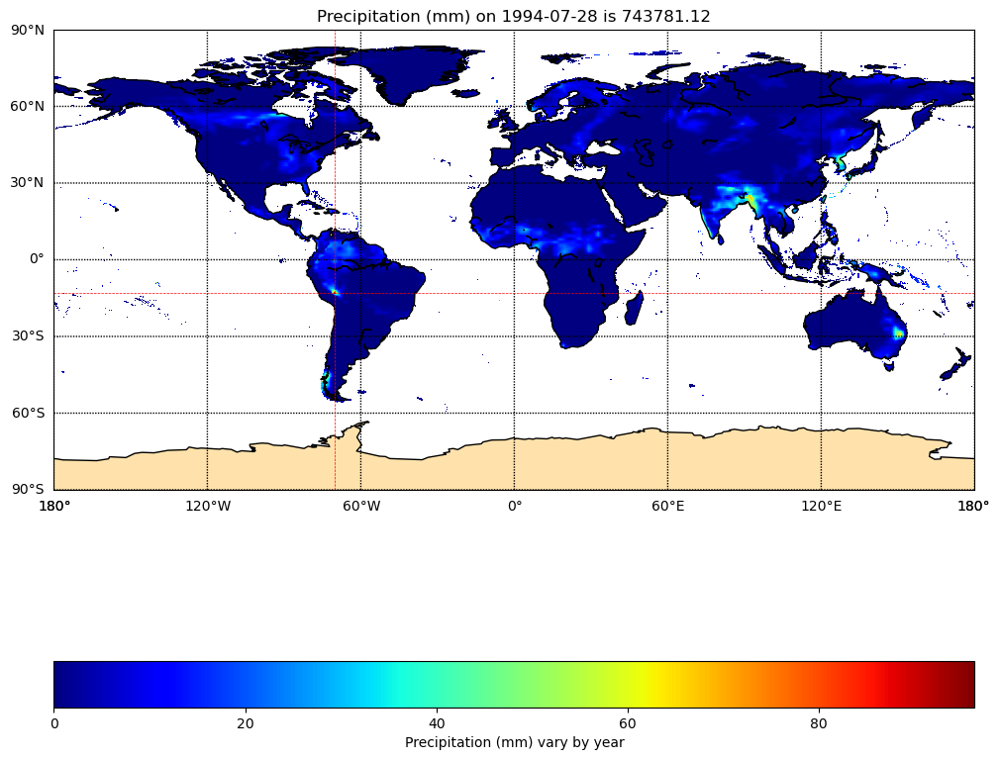

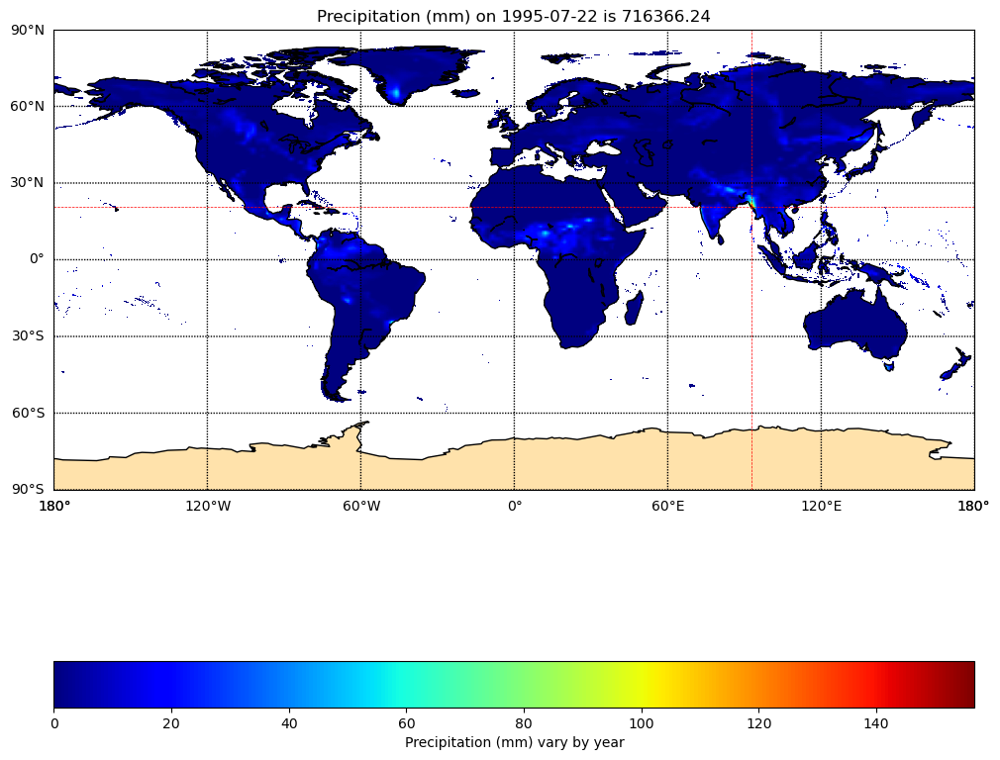

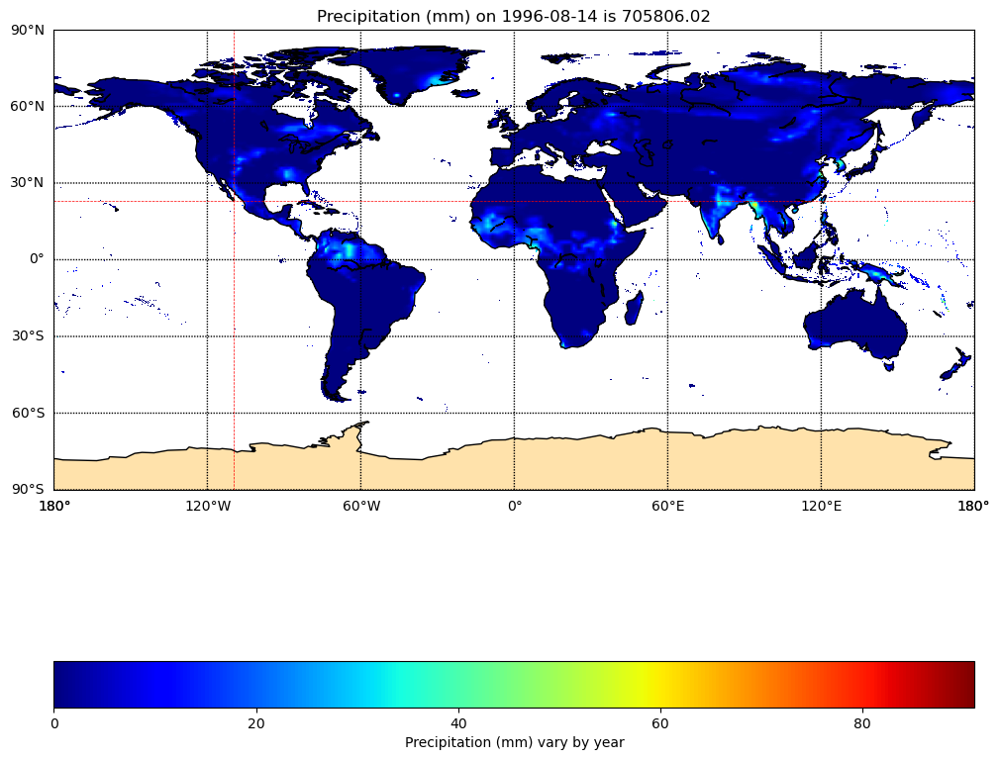

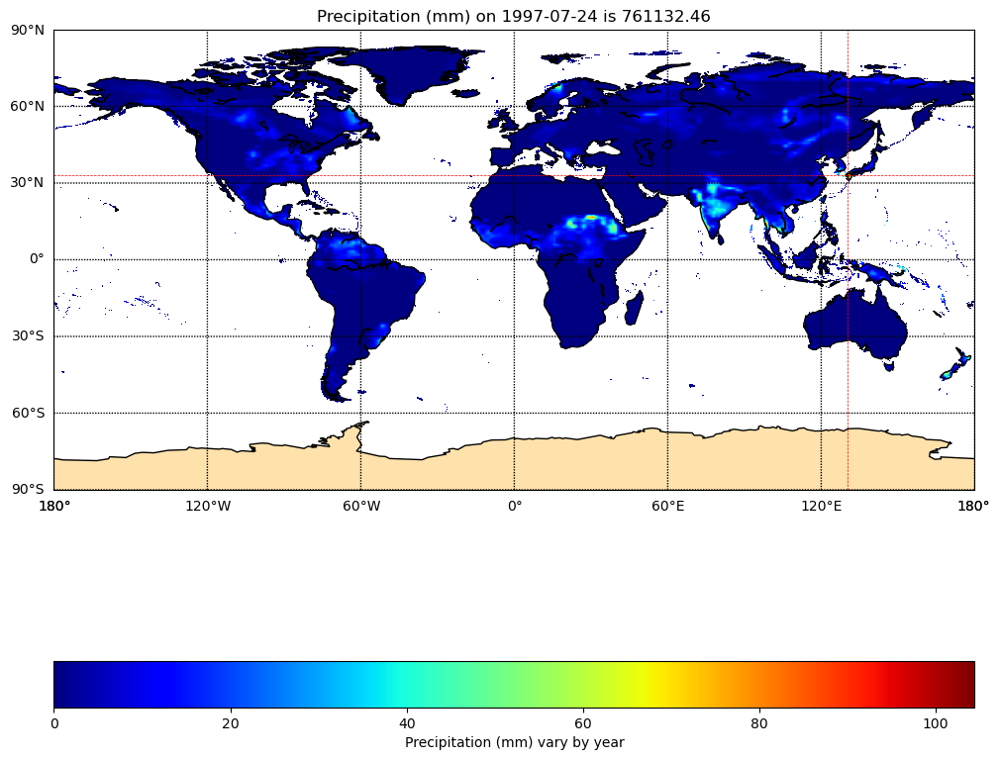

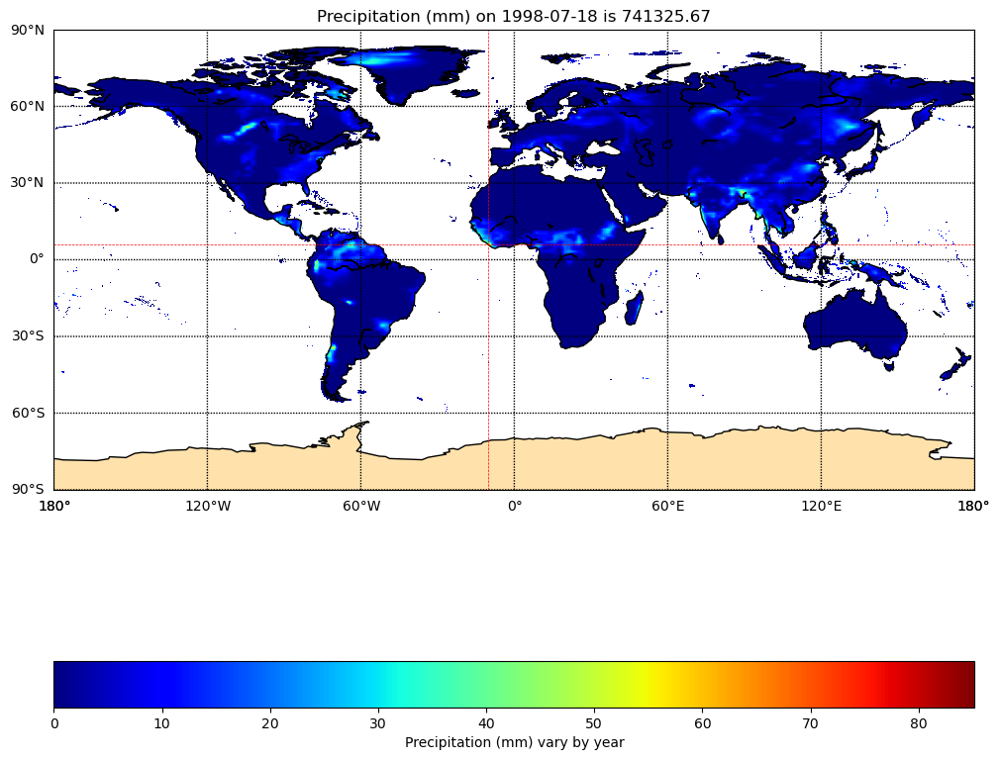

...

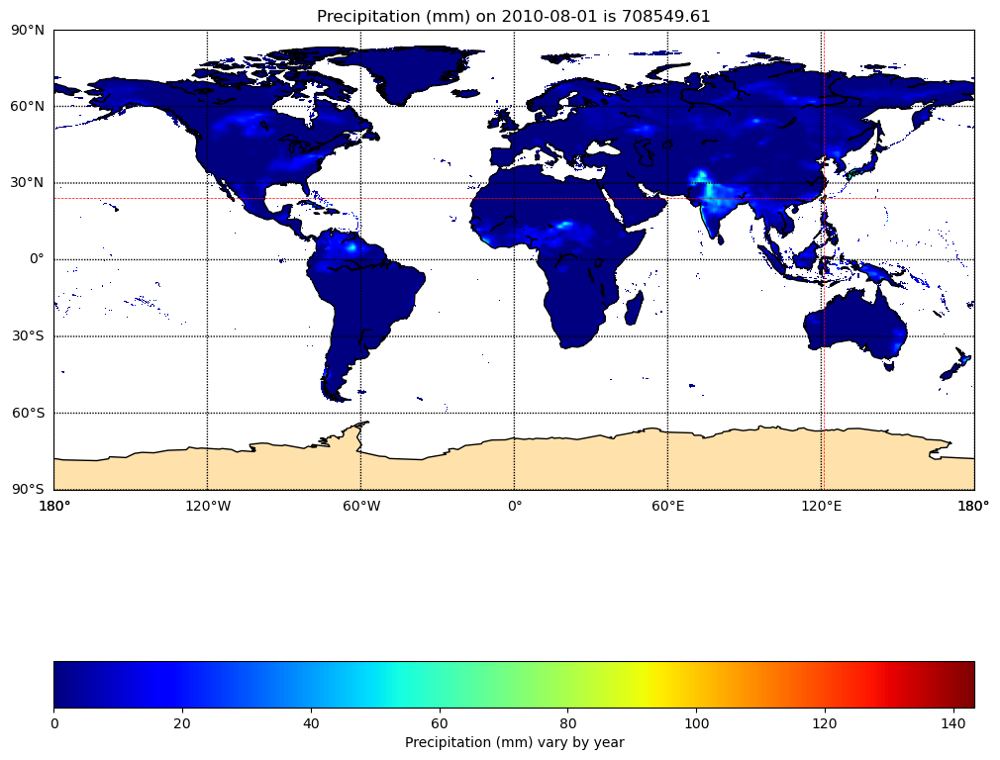

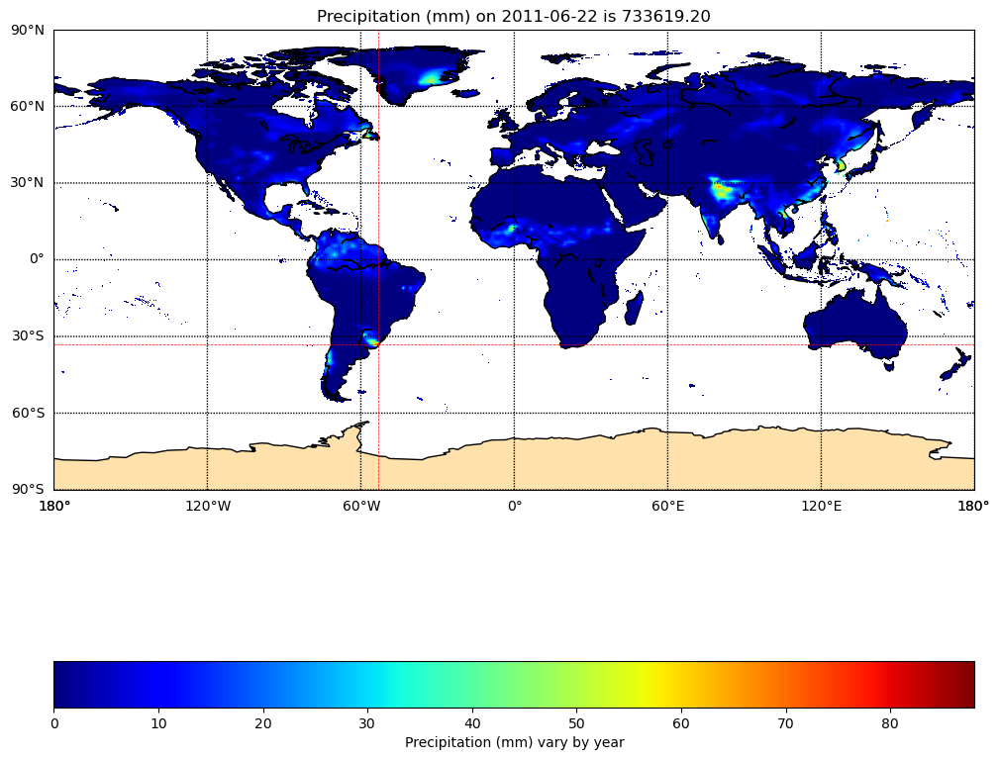

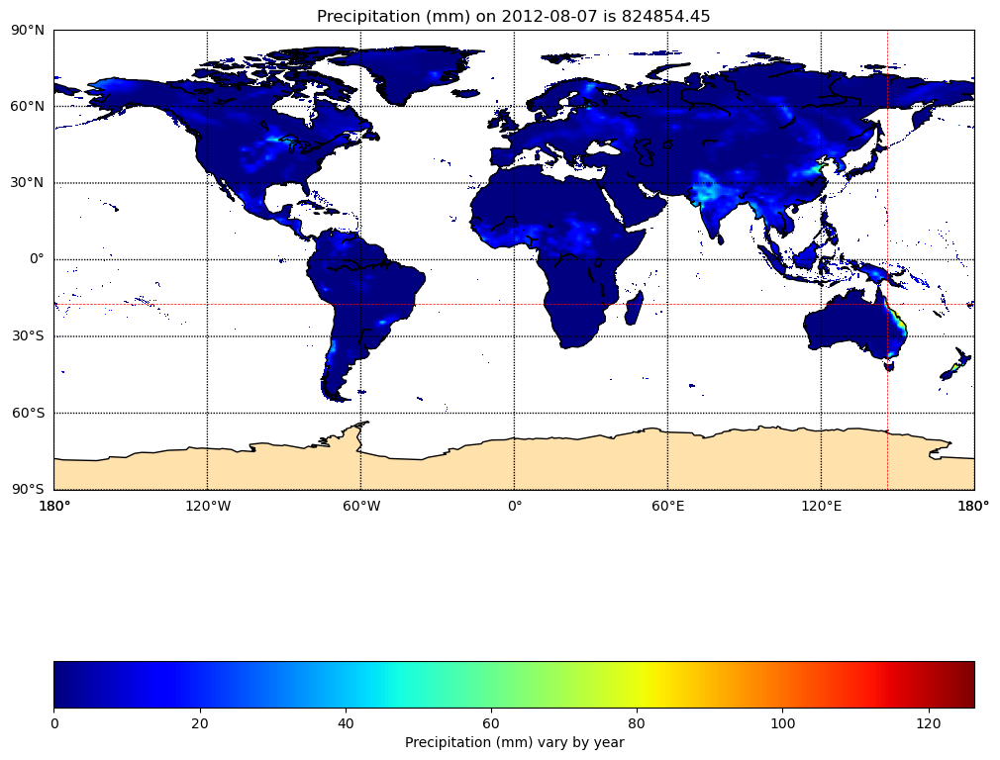

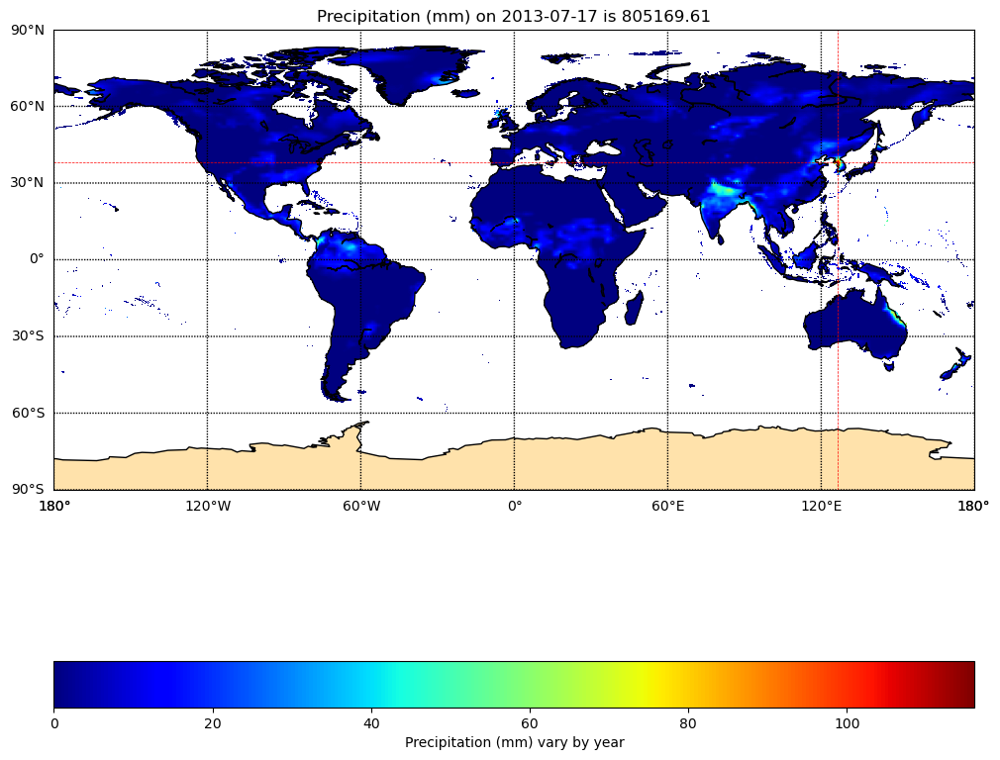

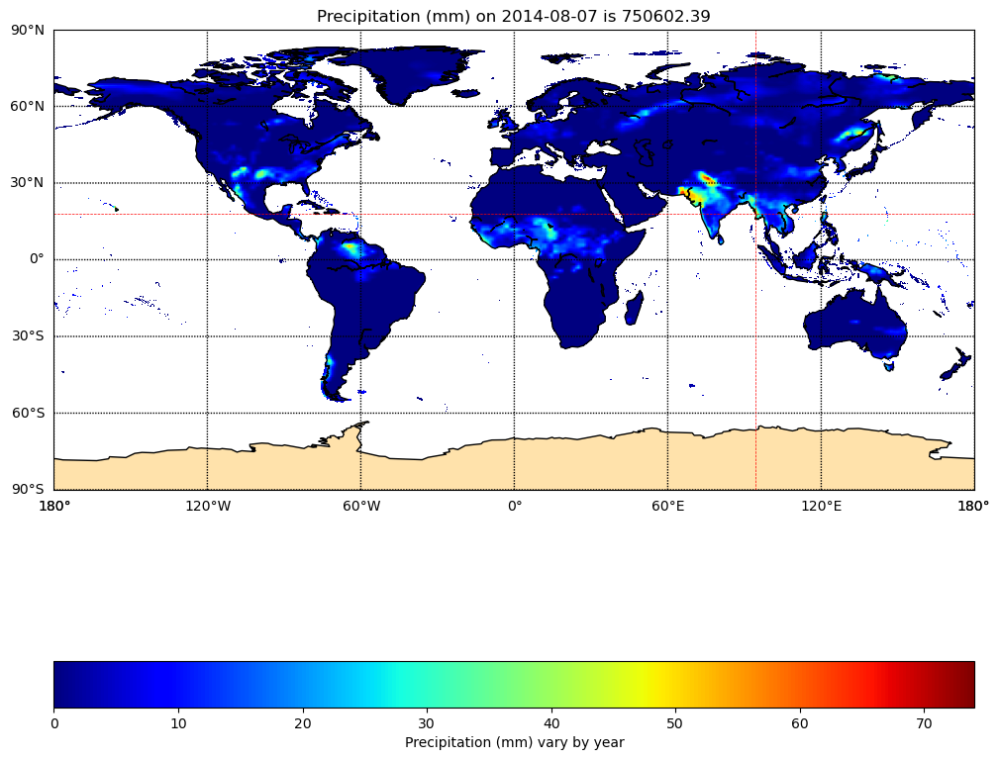

In [13]:
# Visualize highest recorded precipitation in a day accross year. The colour bar maximum value vary. 
# It is to identify area with high precipitation on the global wettest day 
def plot_on_map(max_pr_day, title):
    
    fig = plt.figure(figsize=[12,15]) 
    ax = fig.add_subplot(1, 1, 1) 
    ax.set_title(title)
    
    # Draw base map
    map = Basemap(llcrnrlat=-90, urcrnrlat=90, llcrnrlon=-180, urcrnrlon=180, resolution='c', epsg=4326)    
    map.drawcoastlines()
    map.fillcontinents(color='#ffe2ab')

    # Draw parallels and meridians.
    map.drawparallels(np.arange(-90.,120.,30.), labels=[1,0,0,0])
    map.drawmeridians(np.arange(-180.,180.,60.), labels=[0,0,0,1])
    
    # Create grid for longitudes and latitudes
    llons, llats = np.meshgrid(lon_shift_corners, lat_corners)
    x,y = map(llons, llats)
    
    # Plot filled areas corresponding to precipitation values
    cmap = plt.get_cmap('jet')
    cs = map.pcolormesh(x, y, max_pr_day, cmap=cmap, shading='auto')
    
    # Add color bar with label
    plt.colorbar(cs, orientation='horizontal', label='Precipitation (mm) vary by year')
    
    # Find the indices of the maximum precipitation value
    max_lat_idx, max_lon_idx = np.unravel_index(np.argmax(max_pr_day), max_pr_day.shape)
    # Retrieve the corresponding latitude and longitude
    max_lat = lat[max_lat_idx]
    max_lon_shift = lon_shift[max_lon_idx]
    # Draw lines indicating the location of maximum precipitation
    ax.axvline(max_lon_shift, color='red', linestyle='--', linewidth=0.5)
    ax.axhline(max_lat, color='red', linestyle='--', linewidth=0.5)

    plt.show()

# Iterate over data for each year and plot precipitation on map with varying color bar maximum value
for max_pr_day, total_pr, date in zip(max_pr_mm_1d_annual_map_shift, max_pr_mm_1d_annual, max_pr_date_1d_annual):
    title = f"Precipitation (mm) on {date.strftime(format='%Y-%m-%d')} is {total_pr:.2f}"
    plot_on_map(max_pr_day, title)

Average of precipitation across years

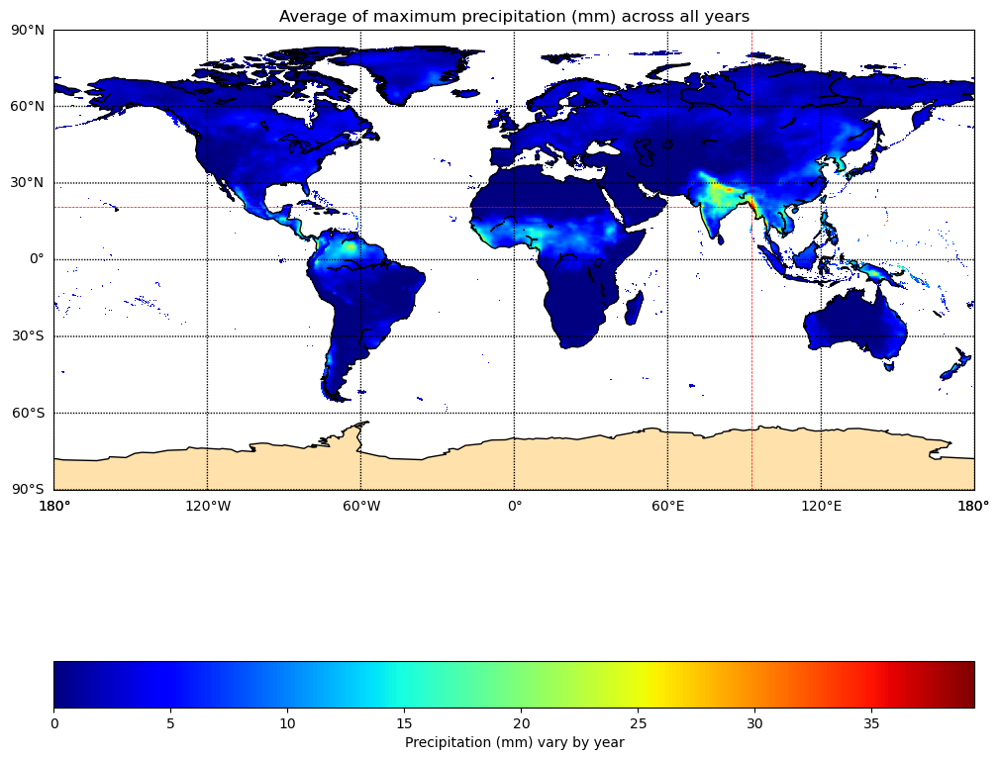

In [14]:
# Compute the average of maximum precipitation across all years
max_pr_day_avg_year = np.mean(np.ma.array(max_pr_mm_1d_annual_map_shift), axis=0)
title = f"Average of maximum precipitation (mm) across all years"

# Plot the average maximum precipitation on map
plot_on_map(max_pr_day_avg_year, title)


### Approach 2: Different dates in a year for all observation points (Localize)

Calculation of metric

In [15]:
# Highest precipitation on any day (shape: lat x long) for each year
max_pr_mm_diff_day_annual_map = [np.max(pr, axis=0) * PR_MM for pr in pr_ls]

# Shift longitudes for highest precipitation on any day (shape: lat x long) for each year
max_pr_mm_diff_day_annual_map_shift = [shift_lon_grid(pr_mm_map, lon)[0] for pr_mm_map in max_pr_mm_diff_day_annual_map]

# Total of max precipitation for each year
max_pr_mm_diff_day_annual = [np.sum(pr_mm_map) for pr_mm_map in max_pr_mm_diff_day_annual_map]

# Historical maximum precipitation
max_pr_mm_recorded = max([np.max(pr_map) for pr_map in max_pr_mm_diff_day_annual_map])

Visualization

slope: 13938.5041871596


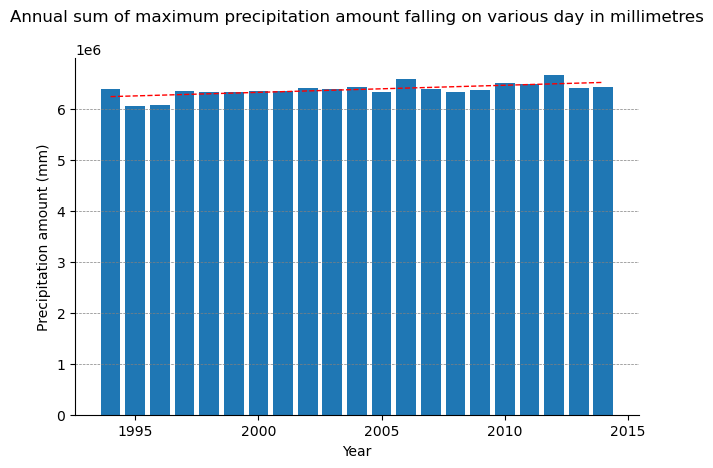

In [16]:
# Bar chart showing the annual maximum precipitation amount falling in a single day
fig, ax = plt.subplots()

# Plotting the data
ax.bar(year_ls, max_pr_mm_diff_day_annual)

# Setting labels and title
ax.set_ylabel('Precipitation amount (mm)')
ax.set_xlabel('Year')
ax.set_title('Annual sum of maximum precipitation amount falling on various day in millimetres', y=1.08)

# Setting tick parameters and removing spines
ax.tick_params(axis='both', which='major', labelsize=10)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Adding gridlines
ax.yaxis.grid(True, linestyle='--', linewidth='0.5', color='gray')

# # Calculate the trend line
year_arr = np.array(year_ls)
slope, intercept, _, _, _ = linregress(year_arr, max_pr_mm_diff_day_annual)
trend_line = intercept + slope * year_arr
print('slope:', slope)

# # Plot the trend line
ax.plot(year_ls, trend_line, color='red', linestyle='--', linewidth=1)

plt.tight_layout()
plt.show()


In [17]:
# Get the indices that would sort the maximum precipitation array in descending order
rank_idx_desc =  np.argsort(max_pr_mm_diff_day_annual)[::-1]

# Sort the years based on the descending order of maximum precipitation
year_max_pr_desc = np.array(year_ls)[rank_idx_desc]

# Assign ranks to each year based on the sorted indices
year_ranks = np.zeros(len(year_ls), dtype=int)

# Iterate over sorted years and print the rank along with total precipitation
for rank_i, (year, rank_idx_i) in enumerate(zip(year_max_pr_desc, rank_idx_desc), start=1):
    print(f"Rank {rank_i}: Year {year} with total precipitation of {max_pr_mm_diff_day_annual[rank_idx_i]:.2f}")
    year_ranks[rank_idx_i] = rank_i
    

Rank 1: Year 2012 with total precipitation of 6666560.53
Rank 2: Year 2006 with total precipitation of 6581873.55
Rank 3: Year 2010 with total precipitation of 6502640.52
Rank 4: Year 2011 with total precipitation of 6478926.90
Rank 5: Year 2004 with total precipitation of 6428116.53
Rank 6: Year 2014 with total precipitation of 6425702.27
Rank 7: Year 2013 with total precipitation of 6416368.16
Rank 8: Year 2002 with total precipitation of 6406886.31
Rank 9: Year 1994 with total precipitation of 6398229.35
Rank 10: Year 2003 with total precipitation of 6392627.03
Rank 11: Year 2007 with total precipitation of 6386097.62
Rank 12: Year 2009 with total precipitation of 6378830.15
Rank 13: Year 2001 with total precipitation of 6355400.86
Rank 14: Year 1997 with total precipitation of 6354828.52
Rank 15: Year 2000 with total precipitation of 6345588.98
Rank 16: Year 2005 with total precipitation of 6339195.69
Rank 17: Year 1999 with total precipitation of 6337902.86
Rank 18: Year 2008 with

In [18]:
# Annimation:
# Visualize Annual maximum daily precipitation at a location (on diff day). The colour bar is standardised. 
# It is to identify the maximum precipitation in each location

fig, ax = plt.subplots(figsize=[10, 6])

# Add an overall title
fig.suptitle('Annual maximum precipitation amount (mm) falling on any day', fontsize=20)

def update(frame):
    '''
    Update frames in animation
    '''
    ax.clear()
    max_pr_day, year_i, year_i_rank = max_pr_mm_diff_day_annual_map_shift[frame], year_ls[frame], year_ranks[frame]
    pr_rank = year_i_rank
    year_str = str(year_i)
    plot_on_map_max_pr(ax, max_pr_day, year_str, max_pr_mm_recorded, pr_rank)
    
# Define the total number of frames
total_frames = len(max_pr_mm_diff_day_annual_map_shift)

# Create the animation
ani = FuncAnimation(fig, update, frames=total_frames, interval=1000, repeat=False)
plt.tight_layout()
html_video = ani.to_html5_video()
file_name = "Approach_2_annual_max_pr_any_day.mp4"
ani.save(file_name)
plt.close()
print(f"Refer to {file_name} if no animation show in the output")
HTML(html_video)

Refer to Approach_2_annual_max_pr_any_day.mp4 if no animation show in the output


C:\Users\vivia\anaconda3\envs\env37\lib\site-packages\ipykernel_launcher.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


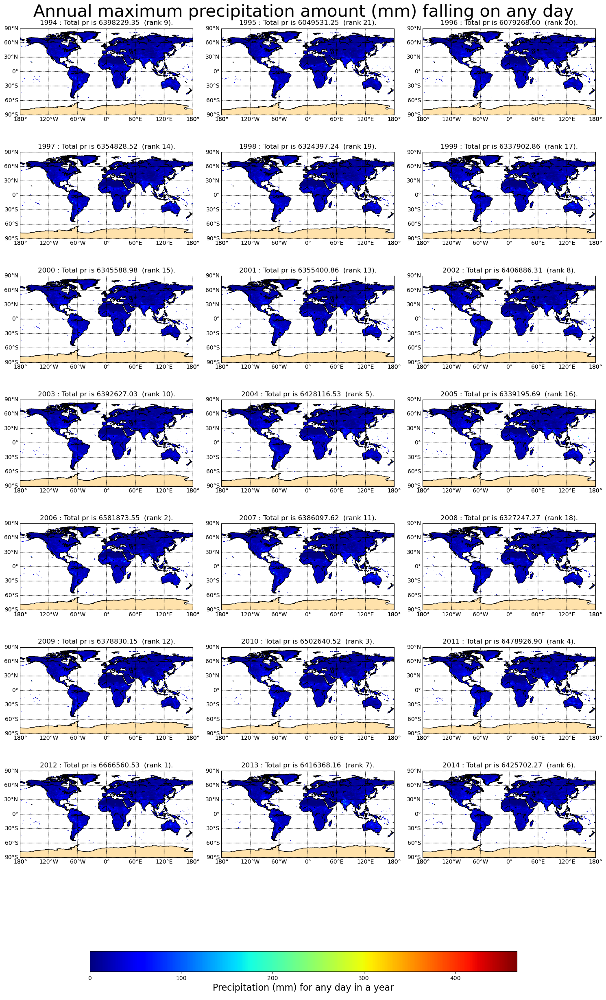

In [19]:
# Flatten the above animation:
# Visualize Annual maximum daily precipitation at a location (on diff day). The colour bar is standardised. 
# It is to identify the maximum precipitation in each location

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=8, ncols=3, figsize=[15, 25])  # Adjusted number of rows

# Add an overall title
fig.suptitle('Annual maximum precipitation amount (mm) falling on any day', fontsize=30)

# Iterate over data for each year to create subplots
for i, (max_pr_day, year_i, year_i_rank) in enumerate(zip(max_pr_mm_diff_day_annual_map_shift, year_ls, year_ranks)):
    row = i // 3
    col = i % 3
    pr_rank = year_i_rank
    date_str = str(year_i)
    cs = subplot_on_map(axes[row, col], max_pr_day, date_str, max_pr_mm_recorded, pr_rank)

# Remove the last row of empty plot boxes
for col in range(3):
    axes[-1, col].axis('off')

# Add a color bar at the bottom
cbar_ax = fig.add_axes([0.15, 0.03, 0.7, 0.02])  # [left, bottom, width, height]
cbar = fig.colorbar(cs, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Precipitation (mm) for any day in a year', fontsize=16, y=0.98)


plt.tight_layout()
plt.show()


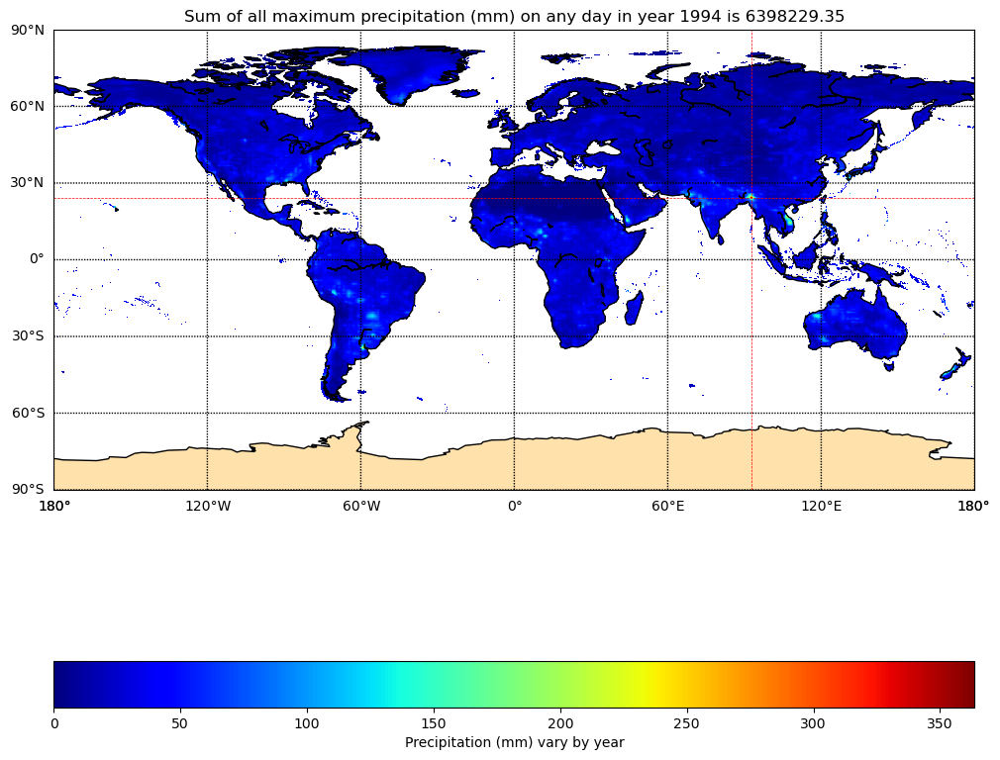

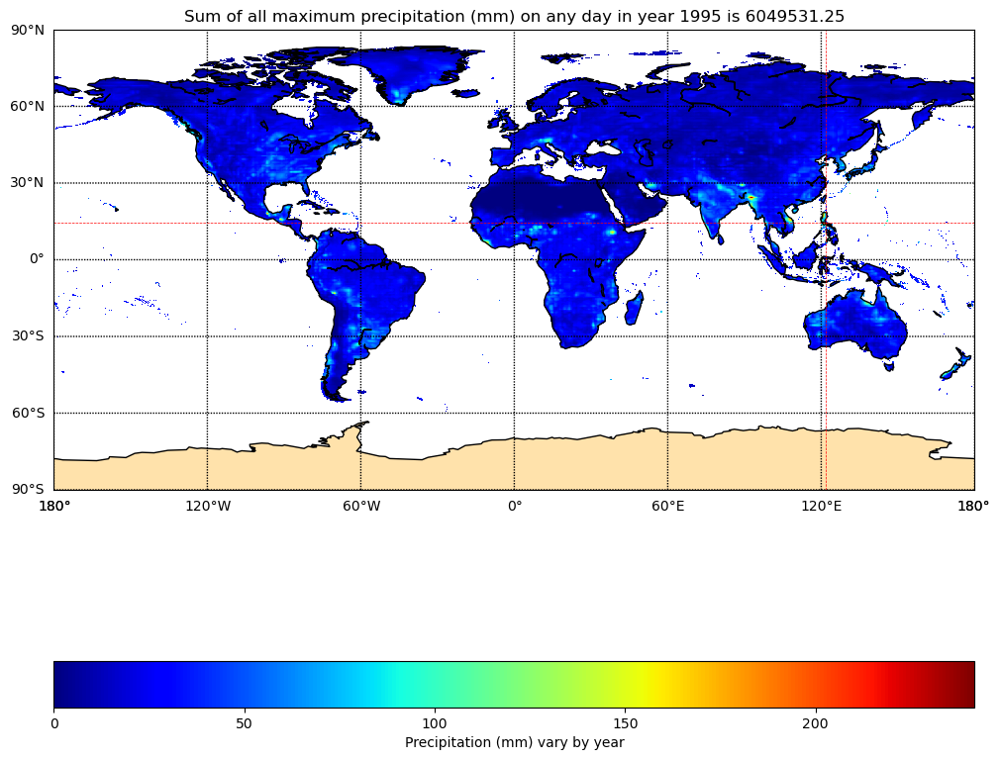

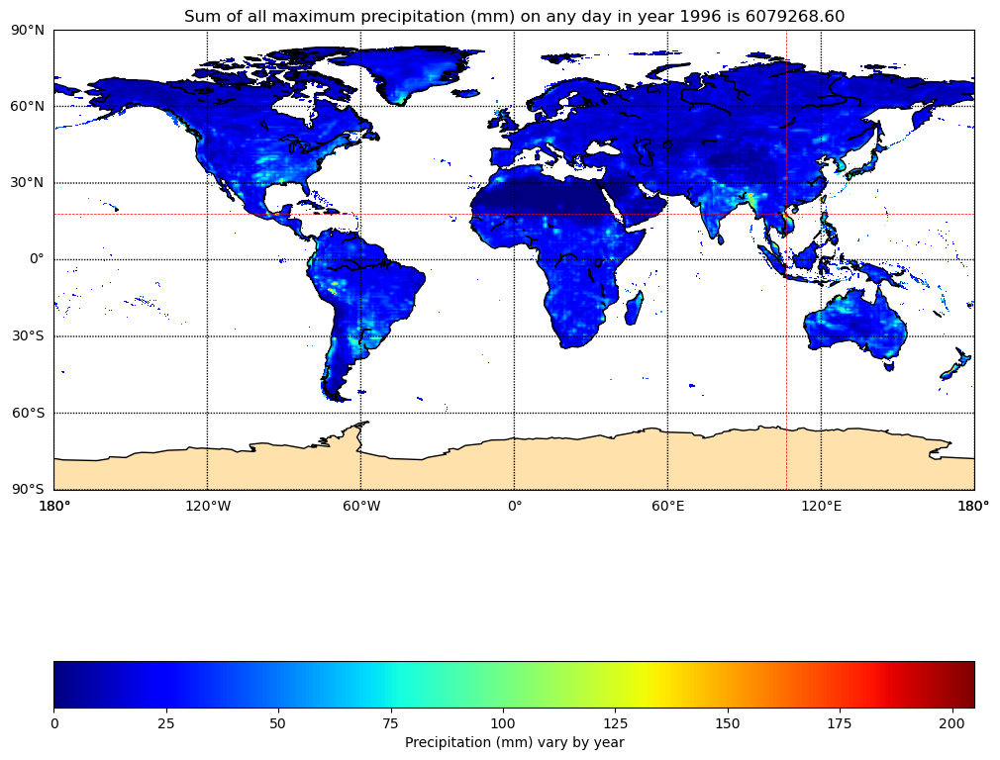

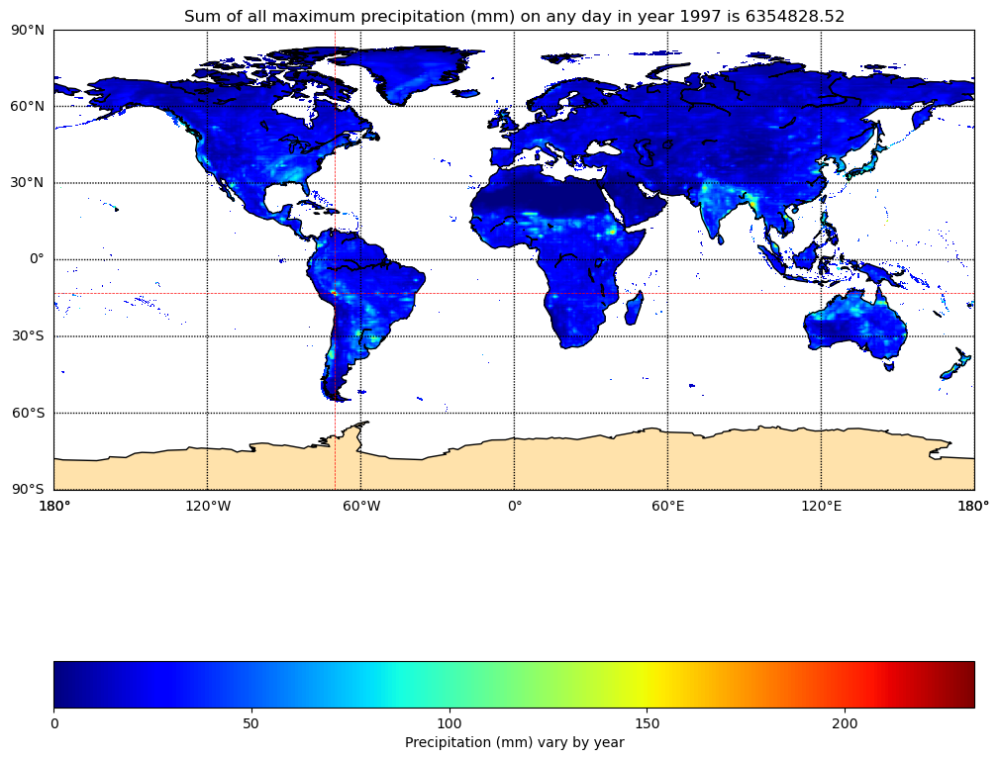

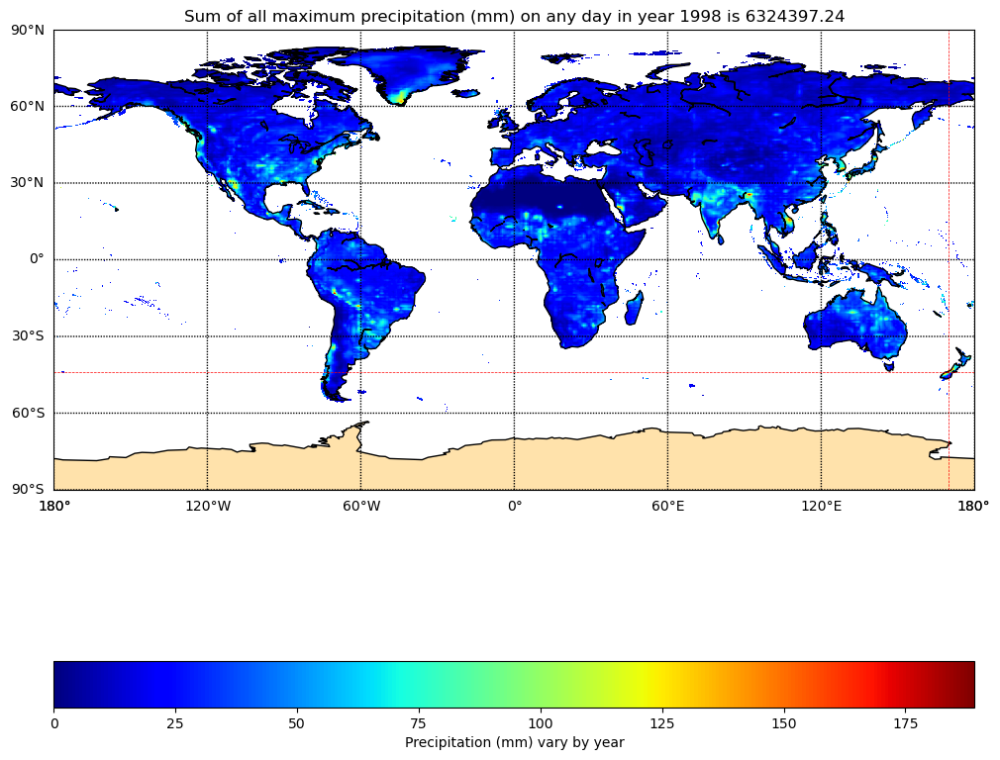

...

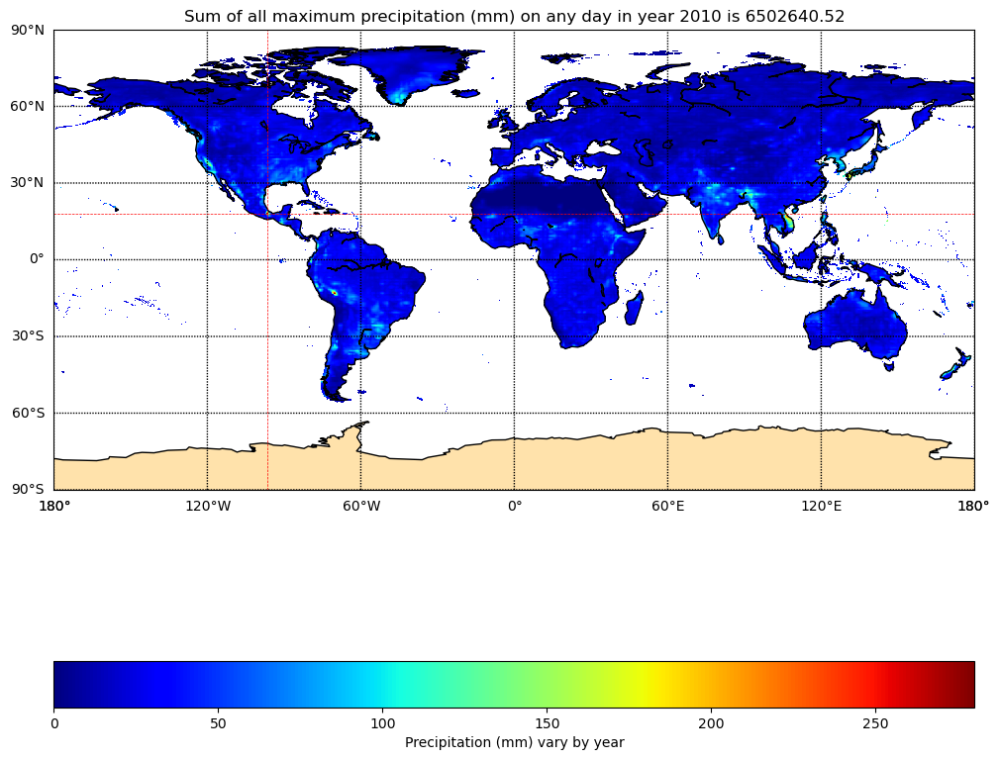

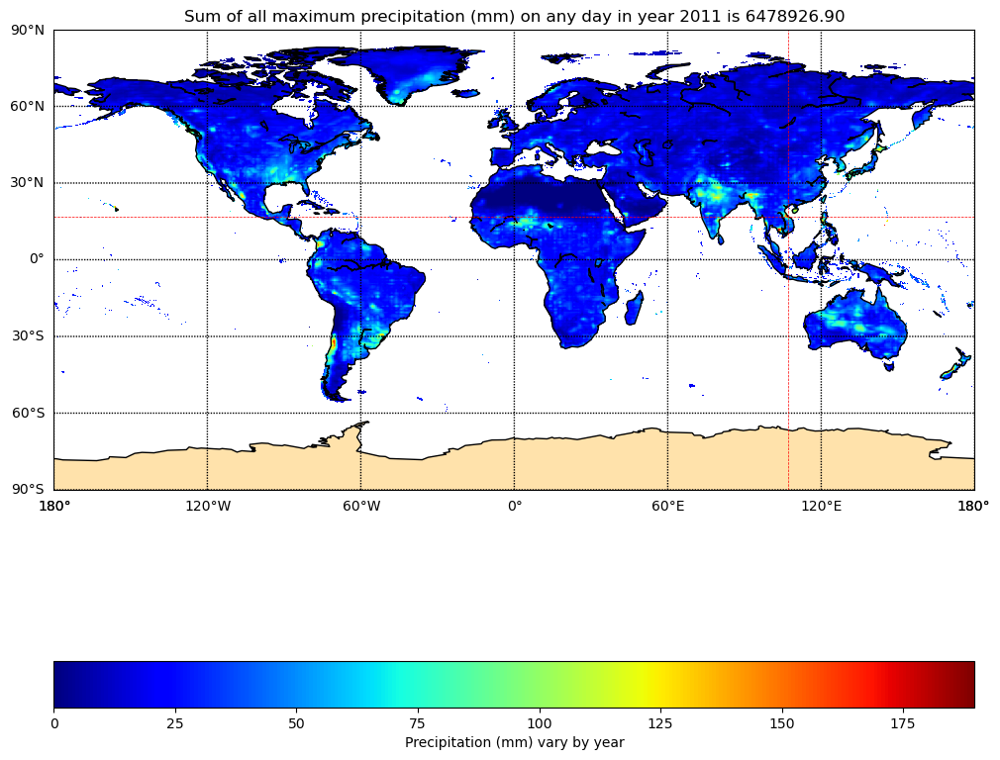

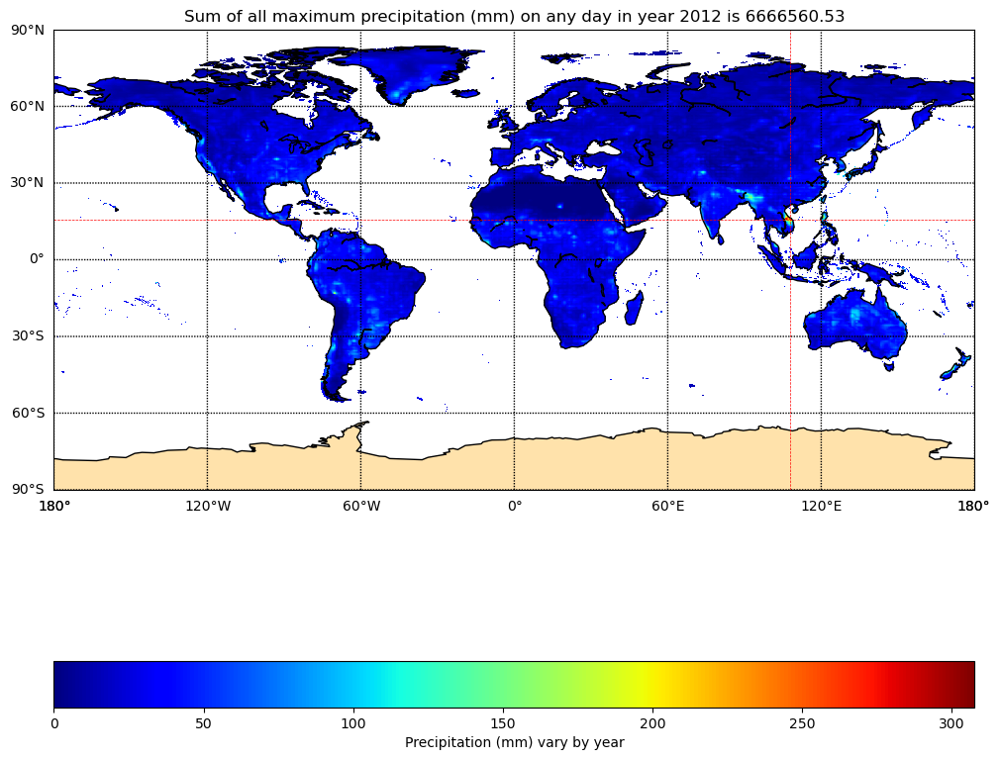

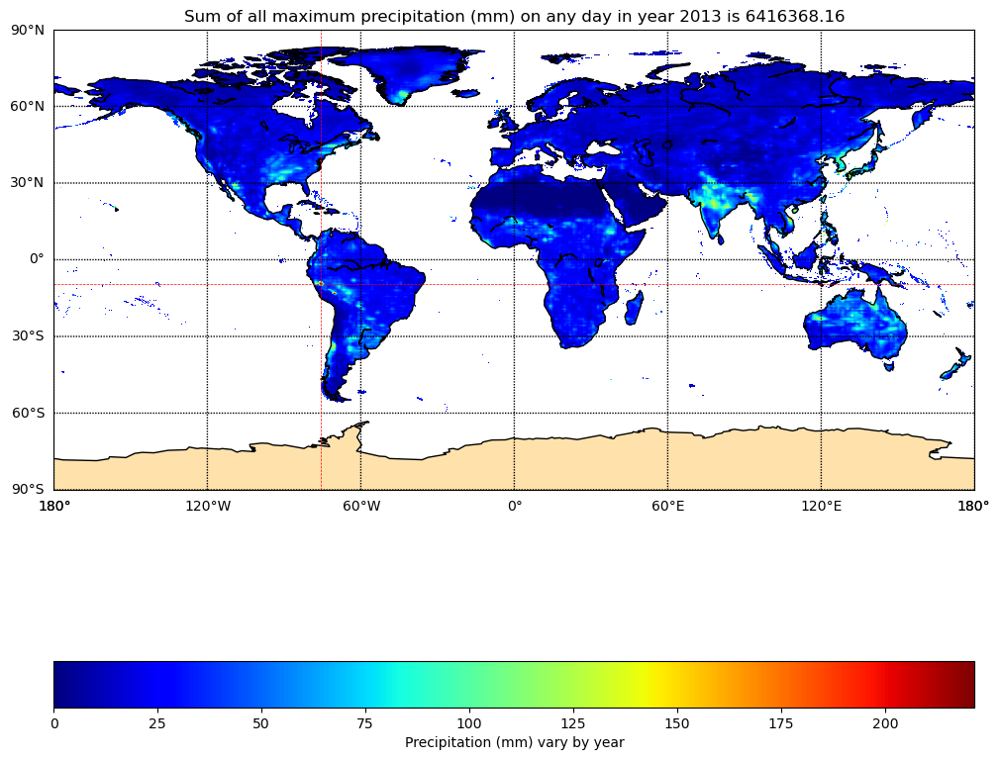

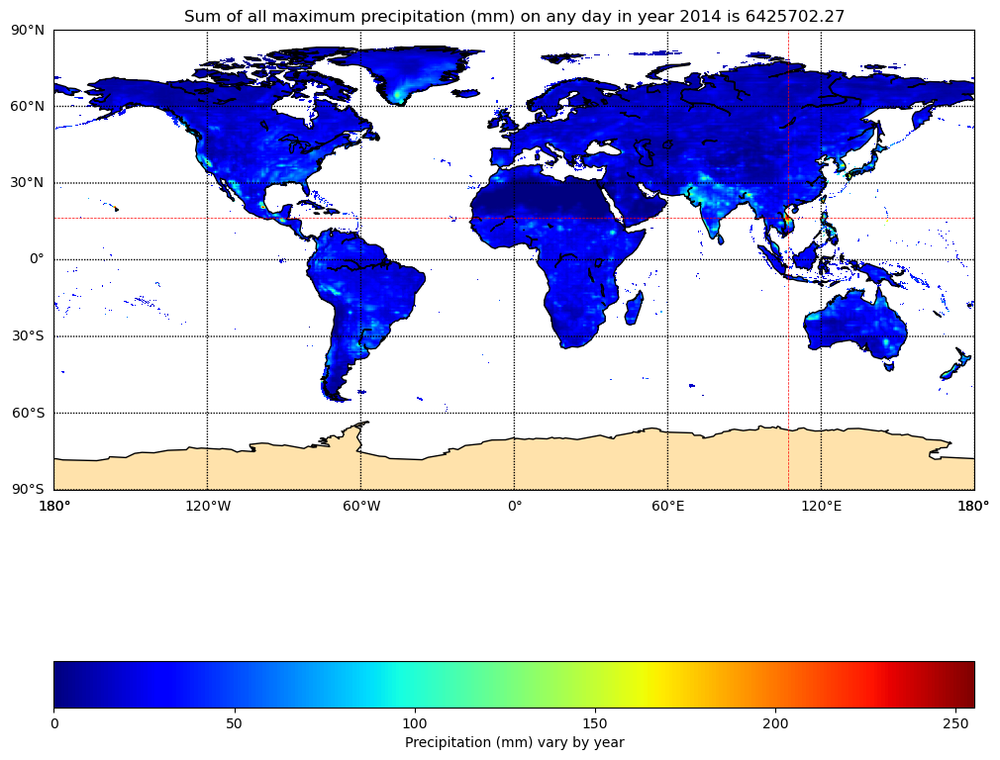

In [20]:
# Visualize highest recorded precipitation in a day accross year. The colour bar maximum value vary. 
# It is to identify the maximum precipitation in each location and where has the highest precipitation of the year 

# Iterate over data for each year and plot precipitation on map with varying color bar maximum value
for max_pr_day, total_pr, year_i in zip(max_pr_mm_diff_day_annual_map_shift, max_pr_mm_diff_day_annual, year_ls):
    title = f"Sum of all maximum precipitation (mm) on any day in year {year_i} is {total_pr:.2f}"
    plot_on_map(max_pr_day, title)

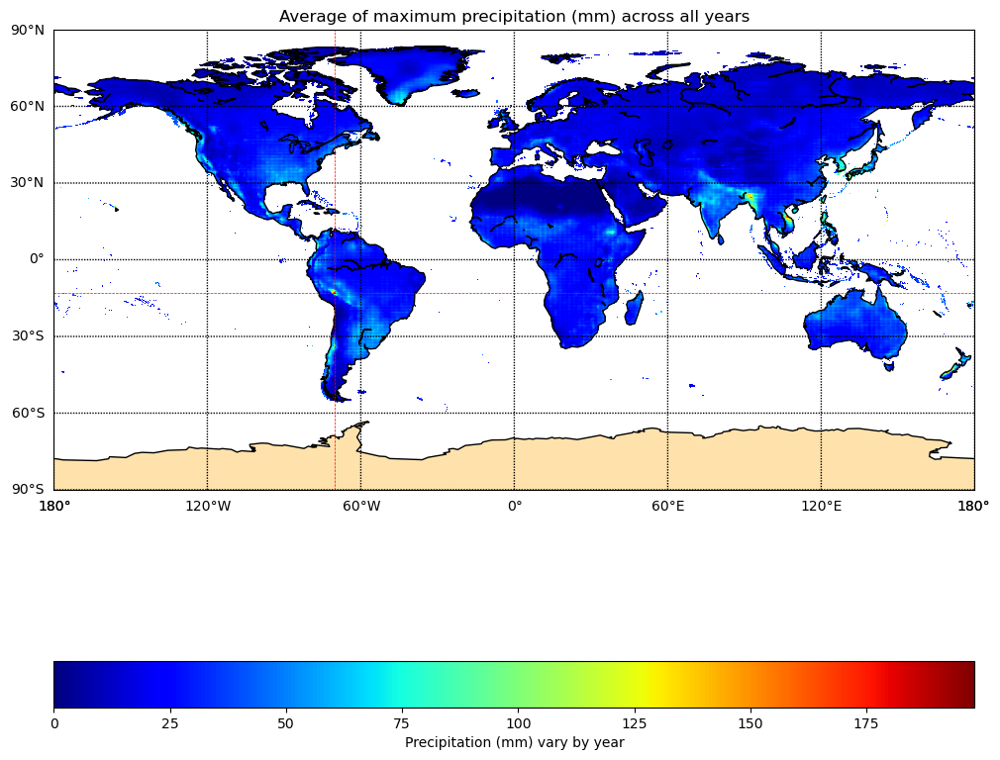

In [21]:
# Compute the average of maximum precipitation across all years
max_pr_diff_day_avg_year = np.mean(np.ma.array(max_pr_mm_diff_day_annual_map_shift), axis=0)
title = f"Average of maximum precipitation (mm) across all years"

# Plot the average maximum precipitation on map
plot_on_map(max_pr_diff_day_avg_year, title)
